In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Instalasi untuk Tesseract OCR Engine dan library Python-nya
print("Menginstal Tesseract OCR Engine...")
!sudo apt-get update -qq
!sudo apt-get install tesseract-ocr -qq
!pip install pytesseract -q

# Instalasi untuk library konversi PDF ke Gambar
# (Diperlukan jika alur kerja Anda dimulai dari file .pdf)
print("\nMenginstal library untuk pemrosesan PDF...")
!sudo apt-get install poppler-utils -qq
!pip install pdf2image -q

print("\nSemua dependensi yang diperlukan sudah siap.")

Menginstal Tesseract OCR Engine...
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)

Menginstal library untuk pemrosesan PDF...
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package poppler-utils.
(Reading database ... 126308 files and directories currently installed.)
Preparing to unpack .../poppler-utils_22.02.0-2ubuntu0.8_amd64.deb ...
Unpacking poppler-utils (22.02.0-2ubuntu0.8) ...
Setting up poppler-utils (22.02.0-2

In [3]:
pip install pytesseract

In [4]:
pip install opencv-python

In [5]:
import cv2
import os
import numpy as np
import math
from PIL import Image
import pytesseract
from pytesseract import Output
from google.colab.patches import cv2_imshow

In [6]:
folder_input_png = '/content/drive/MyDrive/Dataset-Fix-banget'

folder_output_final = '/content/Dataset-Restored/'

os.makedirs(folder_output_final, exist_ok=True)

In [7]:
import glob
daftar_png = glob.glob(os.path.join(folder_input_png, '*.png'))
print(f"Ditemukan {len(daftar_png)} file PNG untuk diproses.")
print("-" * 50)

Ditemukan 64 file PNG untuk diproses.
--------------------------------------------------


In [8]:
def rotate_image(image, angle, border_value=(255,255,255)):
    """Memutar gambar dengan presisi menggunakan interpolasi INTER_CUBIC untuk kualitas tinggi."""
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY
    return cv2.warpAffine(image, M, (nW, nH), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_CONSTANT, borderValue=border_value)

In [21]:
def detect_fine_skew(image, angle_range=10, min_angle_threshold=0.1):
    """
    Fungsi KHUSUS untuk mendeteksi kemiringan HALUS pada gambar yang sudah lurus secara kasar.
    """
    print("   -> Memulai deteksi kemiringan halus...")
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bitwise_not(gray)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)

    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 100, minLineLength=50, maxLineGap=5)

    if lines is None:
        print("   -> Tidak ada garis terdeteksi untuk koreksi halus. Melewati...")
        return image

    angles = []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        angle = np.rad2deg(np.arctan2(y2 - y1, x2 - x1))
        if abs(angle) < angle_range:
            angles.append(angle)

    if not angles:
        print(f"   -> Tidak ada garis dalam rentang +/- {angle_range} derajat. Melewati...")
        return image

    median_angle = np.median(angles)
    print(f"   -> Sudut kemiringan halus terdeteksi: {median_angle:.4f} derajat.")

    if abs(median_angle) < min_angle_threshold:
        print("   -> Sudut terlalu kecil, rotasi halus diabaikan.")
        return image

    corrected_image = rotate_image(image, median_angle)
    return corrected_image

In [23]:
PATH_GAMBAR_INPUT = "/content/drive/MyDrive/Dataset-Fix-banget/Salinan CV Muhammad Fatih Al Fawwaz - Fatih Fawwaz_rot_90_noisy.png"
PATH_PDF_OUTPUT = "/content/hasil_restorasi2.pdf"

Memproses file: Salinan CV Muhammad Fatih Al Fawwaz - Fatih Fawwaz_rot_90_noisy.png

[SEBELUM] Gambar Asli


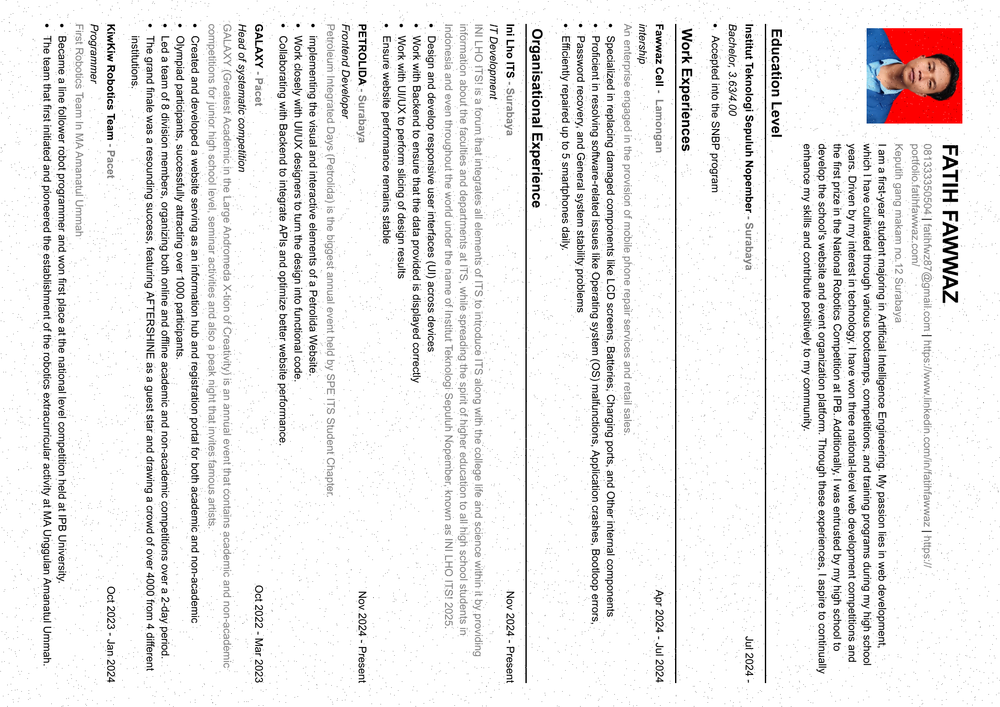

------------------------------------------------------------

-> Langkah 1: Menghilangkan noise...
   Noise dihilangkan.

-> Langkah 2A: Memperbaiki kemiringan kasar...
   Sudut kasar terdeteksi: -90.00 derajat.
   -> Memutar -90 derajat untuk koreksi kasar.

-> Langkah 2B: Memperbaiki kemiringan halus...
   -> Memulai deteksi kemiringan halus...
   -> Sudut kemiringan halus terdeteksi: 0.0000 derajat.
   -> Sudut terlalu kecil, rotasi halus diabaikan.

-> Langkah 3: Menyimpan hasil berwarna ke PDF...
   Selesai! Disimpan sebagai hasil_restorasi2.pdf

[SESUDAH] Gambar Setelah Direstorasi Penuh


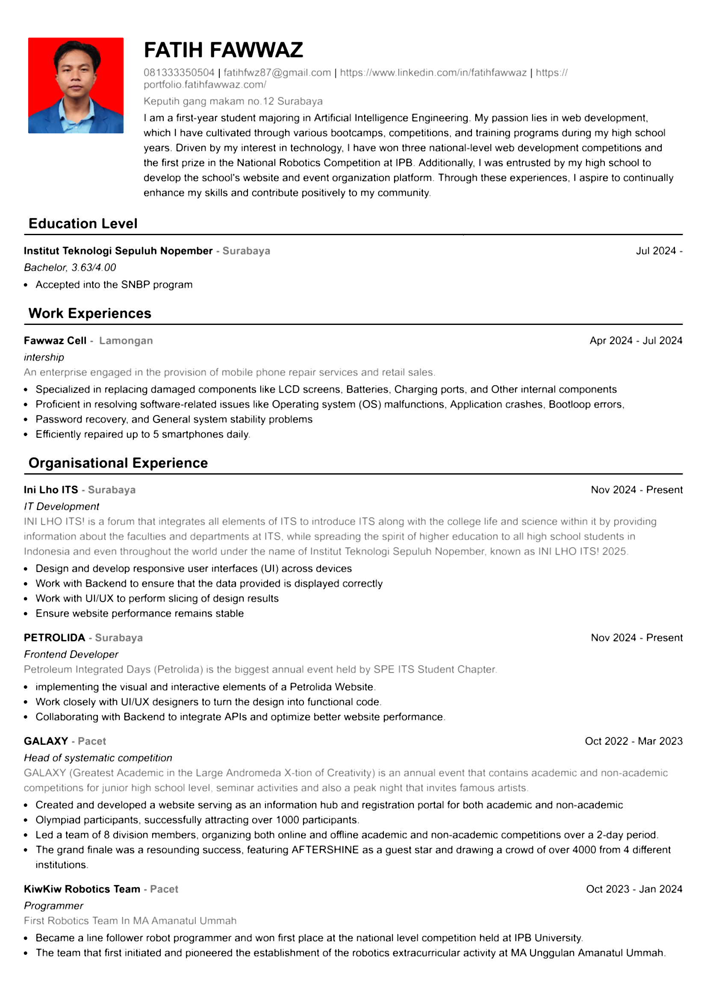

In [24]:
if not os.path.exists(PATH_GAMBAR_INPUT):
    print(f"ERROR: File tidak ditemukan di '{PATH_GAMBAR_INPUT}'.")
else:
    nama_file = os.path.basename(PATH_GAMBAR_INPUT)
    print(f"Memproses file: {nama_file}")

    try:
        gambar_rusak = cv2.imread(PATH_GAMBAR_INPUT)
        print("\n[SEBELUM] Gambar Asli")
        cv2_imshow(gambar_rusak)
        print("-" * 60)

        print("\n-> Langkah 1: Menghilangkan noise...")
        gambar_denoised = cv2.medianBlur(gambar_rusak, 3)
        print("   Noise dihilangkan.")

        # --- 2A: KOREKSI KEMIRINGAN KASAR (90 DERAJAT) ---
        print("\n-> Langkah 2A: Memperbaiki kemiringan kasar...")
        gray = cv2.cvtColor(gambar_denoised, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray, 50, 150, apertureSize=3)
        lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)

        gambar_lurus_kasar = gambar_denoised
        if lines is not None:
            angles = []
            for line in lines:
                x1, y1, x2, y2 = line[0]
                angle = np.rad2deg(np.arctan2(y2 - y1, x2 - x1))
                angles.append(angle)

            if angles:
                median_angle = np.median(angles)
                print(f"   Sudut kasar terdeteksi: {median_angle:.2f} derajat.")
                if abs(median_angle) > 45:
                    print("   -> Memutar -90 derajat untuk koreksi kasar.")
                    gambar_lurus_kasar = cv2.rotate(gambar_denoised, cv2.ROTATE_90_COUNTERCLOCKWISE)
                else:
                    print("   -> Kemiringan kasar tidak terdeteksi, melanjutkan ke koreksi halus.")
        else:
             print("   -> Tidak ada garis terdeteksi untuk koreksi kasar.")

        # --- 2B: KOREKSI KEMIRINGAN HALUS ---
        print("\n-> Langkah 2B: Memperbaiki kemiringan halus...")
        gambar_lurus_final = detect_fine_skew(gambar_lurus_kasar)

        print(f"\n-> Langkah 3: Menyimpan hasil berwarna ke PDF...")
        gambar_final_rgb = cv2.cvtColor(gambar_lurus_final, cv2.COLOR_BGR2RGB)
        pil_image = Image.fromarray(gambar_final_rgb)
        pil_image.save(PATH_PDF_OUTPUT, "PDF", resolution=100.0)
        print(f"   Selesai! Disimpan sebagai {os.path.basename(PATH_PDF_OUTPUT)}")

        print("\n[SESUDAH] Gambar Setelah Direstorasi Penuh")
        cv2_imshow(gambar_lurus_final)
        print("="*60)

    except Exception as e:
        print(f"   Terjadi error saat memproses {nama_file}: {e}")

In [14]:
PATH_PDF_INPUT = "/content/hasil_restorasi2.pdf"

KERNEL_SIZE_PENEBALAN = (2, 2)

PATH_ENHANCED_PDF_OUTPUT = "/content/hasil_final_ditebalkan2.pdf"

In [16]:
from pdf2image import convert_from_path


Memulai Alat 2: Penebalan Teks Berwarna...

[SEBELUM] Gambar berwarna dari PDF yang akan ditebalkan:


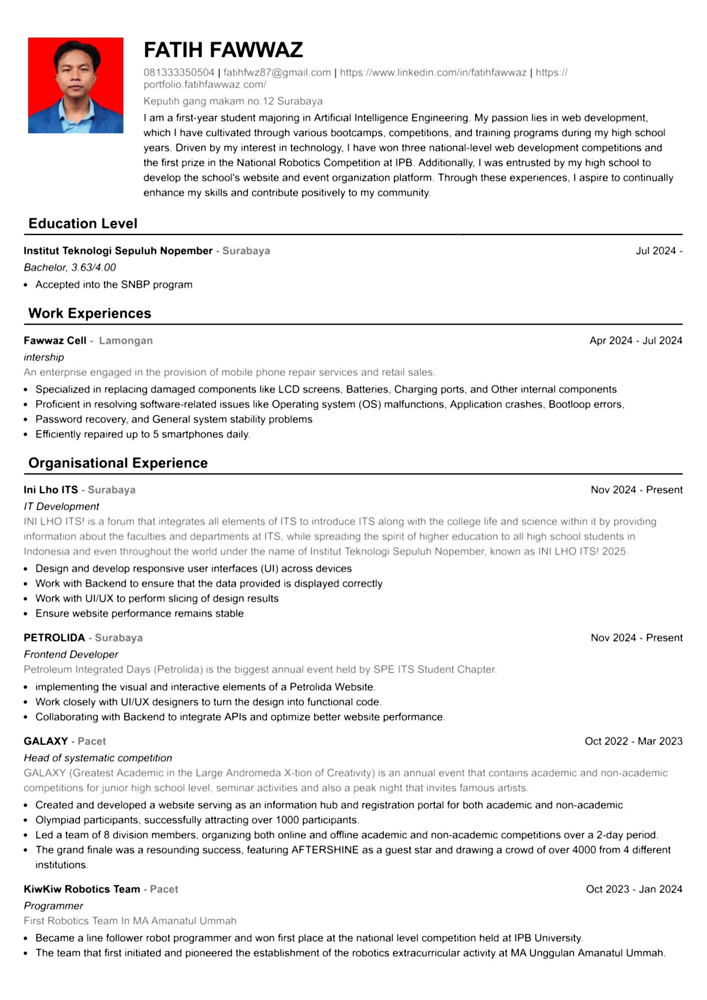

------------------------------------------------------------
-> Membuat 'peta' lokasi teks (mask)...
-> Menebalkan 'peta' teks dengan kernel (2, 2)...
-> Menerapkan 'peta' tebal ke gambar berwarna asli...
-> Menyimpan hasil ke /content/hasil_final_ditebalkan2.pdf...

[SESUDAH] Hasil Akhir dengan Teks Ditebalkan (Warna Dipertahankan)


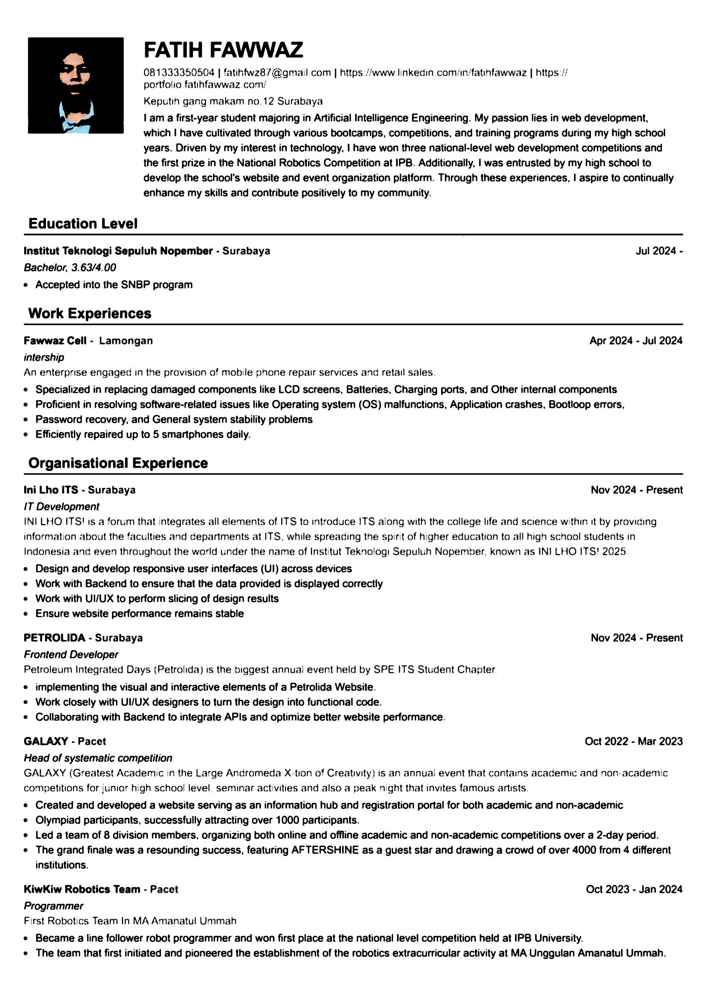


--- Proses Alat 2 Selesai! ---


In [25]:
print("="*60)
print("Memulai Alat 2: Penebalan Teks Berwarna...")
print("="*60)

if not os.path.exists(PATH_PDF_INPUT):
    print(f"ERROR: File PDF input tidak ditemukan di '{PATH_PDF_INPUT}'.")
else:
    try:
        image_pil = convert_from_path(PATH_PDF_INPUT, first_page=1, last_page=1)[0]
        gambar_berwarna_input = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)

        print("\n[SEBELUM] Gambar berwarna dari PDF yang akan ditebalkan:")
        cv2_imshow(gambar_berwarna_input)
        print("-" * 60)

        print("-> Membuat 'peta' lokasi teks (mask)...")
        gambar_gray = cv2.cvtColor(gambar_berwarna_input, cv2.COLOR_BGR2GRAY)
        _, text_mask = cv2.threshold(gambar_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        if KERNEL_SIZE_PENEBALAN is not None:
            print(f"-> Menebalkan 'peta' teks dengan kernel {KERNEL_SIZE_PENEBALAN}...")
            kernel = np.ones(KERNEL_SIZE_PENEBALAN, np.uint8)
            thick_text_mask = cv2.dilate(text_mask, kernel, iterations=1)
        else:
            print("-> Tidak ada penebalan, menggunakan mask asli.")
            thick_text_mask = text_mask

        print("-> Menerapkan 'peta' tebal ke gambar berwarna asli...")
        gambar_hasil = gambar_berwarna_input.copy()
        gambar_hasil[thick_text_mask == 255] = [0, 0, 0]

        print(f"-> Menyimpan hasil ke {PATH_ENHANCED_PDF_OUTPUT}...")
        gambar_hasil_rgb = cv2.cvtColor(gambar_hasil, cv2.COLOR_BGR2RGB)
        pil_image_final = Image.fromarray(gambar_hasil_rgb)
        pil_image_final.save(PATH_ENHANCED_PDF_OUTPUT, "PDF", resolution=100.0)

        print("\n[SESUDAH] Hasil Akhir dengan Teks Ditebalkan (Warna Dipertahankan)")
        cv2_imshow(gambar_hasil)
        print("\n--- Proses Alat 2 Selesai! ---")
        print("="*60)

    except Exception as e:
        print(f"   Terjadi error: {e}")